# Lab 1: Solutions

### Setting up functions/variables that stay constant throughout

In [92]:
%matplotlib inline

#for number operations
import numpy as np 

#for graphing
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML

In [93]:
#Sensor (stays constant)
def sense(x): #simulate sensor
    return x


### Question #1
___

In [94]:
def simulate(Δt, x, u): #dynamics
    x += Δt * u
    return x

In [95]:
def control(t, y): #control policy
    ### WRITE YOUR CONTROL POLICY HERE:
    ux=-2*np.sin(t)
    uy=np.cos(t)
    return np.array([ux, uy])

In [96]:
#Getting point robot path
tf = 10
Δt = 0.1    # Time step
time = np.linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
x = np.array([5., 2.])
x_log = [np.copy(x)]

for t in time:
    y = sense(x)
    u = control(t, y)    
    x = simulate(Δt, x, u)
    x_log.append(np.copy(x))
    
x_log = np.array(x_log)


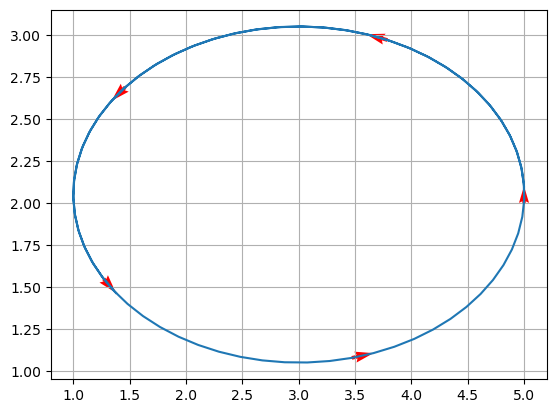

In [97]:
#Graphing
plt.grid()
plt.plot(x_log[:,0], x_log[:,1])
num_arrows = 5
arrow_indices = np.linspace(0, len(x_log) - 2, num_arrows, dtype=int)

# Adding arrows
for i in arrow_indices:
    dx = x_log[i + 1, 0] - x_log[i, 0]  # change in x
    dy = x_log[i + 1, 1] - x_log[i, 1]  # change in y
    plt.quiver(x_log[i, 0], x_log[i, 1], dx, dy, 
               angles='xy', scale_units='xy', scale=1, color='red')





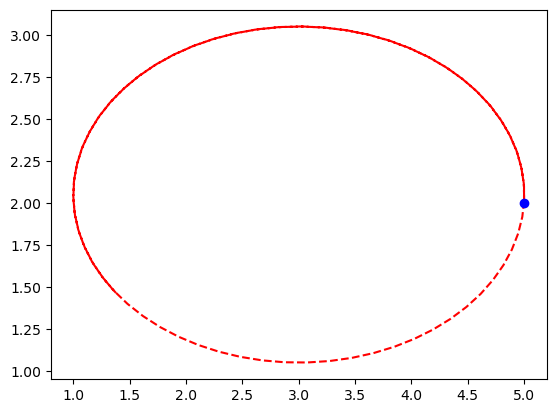

In [98]:

fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    plt.plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plt.plot(x_log[t,0], x_log[t,1], 'bo')
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())


### Question #2
___

In [99]:
def control(t, y): #control policy
    ux=np.cos(t)*(np.cos(30))-np.sin(t)*(np.sin(30))
    uy=np.cos(t)*(np.sin(30))-np.sin(t)*(np.cos(30))
    return np.array([ux, uy])

In [100]:
def simulate(Δt, x, u): #dynamics
    x += Δt * u
    return x

In [101]:
tf = 10
Δt = 0.1    # Time step
time = np.linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
x = np.array([-0.8, 0.])
x_log = [np.copy(x)]


for t in time:
    y = sense(x)
    u = control(t, y)    
    x = simulate(Δt, x, u)
    x_log.append(np.copy(x))
    
x_log = np.array(x_log)


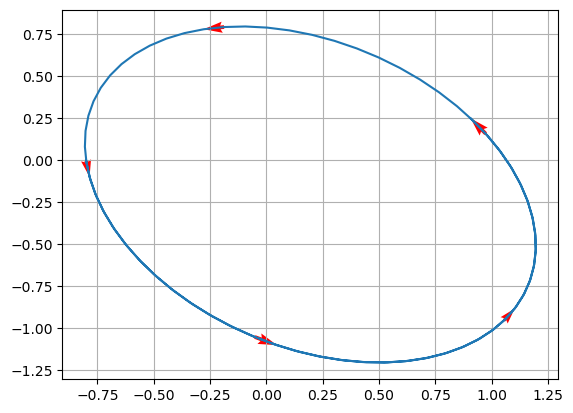

In [102]:
plt.grid()
plt.plot(x_log[:,0], x_log[:,1])
num_arrows = 5
arrow_indices = np.linspace(0, len(x_log) - 2, num_arrows, dtype=int)

# Adding arrows
for i in arrow_indices:
    dx = x_log[i + 1, 0] - x_log[i, 0]  # change in x
    dy = x_log[i + 1, 1] - x_log[i, 1]  # change in y
    plt.quiver(x_log[i, 0], x_log[i, 1], dx, dy, 
               angles='xy', scale_units='xy', scale=1, color='red')

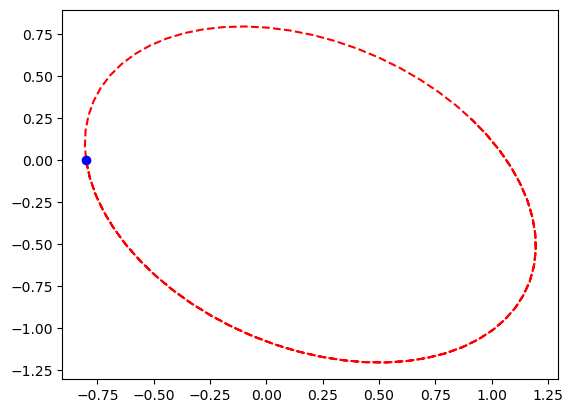

In [103]:
fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    plt.plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plt.plot(x_log[t,0], x_log[t,1], 'bo')
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())


### Question #3
___

In [104]:
#Question 3
def control(t, y): #control policy
    #algebraic lemniscate formula
    ux=np.sin(t)
    uy=np.cos(2*t)
    return np.array([ux, uy])


In [105]:
def simulate(Δt, x, u): #dynamics
    x += Δt * u
    return x

In [106]:
tf = 10
Δt = 0.1    # Time step
#time = np.linspace(0.,tf, int(tf / Δt) + 1)  # Time interval
time = np.linspace(0,2*np.pi, 50)

# Initial conditions
x = np.array([-0.8, 0.])
x_log = [np.copy(x)]


for t in time:
    y = sense(x)
    u = control(t, y)    
    x = simulate(Δt, x, u)
    x_log.append(np.copy(x))
    
x_log = np.array(x_log)


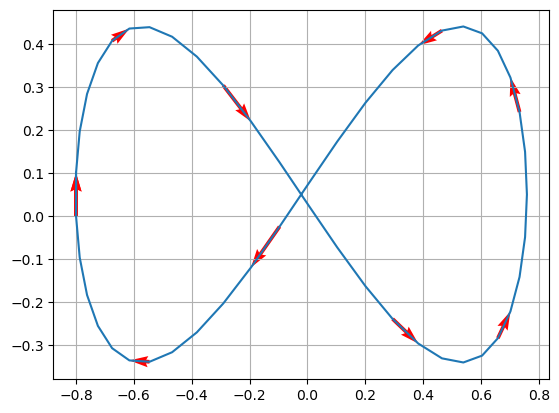

In [107]:
plt.grid()
plt.plot(x_log[:,0], x_log[:,1])
#plt.plot(x,y,markersize=10)
num_arrows = 10
arrow_indices = np.linspace(0, len(x_log) - 2, num_arrows, dtype=int)

#Adding arrows
for i in arrow_indices:
    dx = x_log[i + 1, 0] - x_log[i, 0]  # change in x
    dy = x_log[i + 1, 1] - x_log[i, 1]  # change in y
    plt.quiver(x_log[i, 0], x_log[i, 1], dx, dy, 
    angles='xy', scale_units='xy', scale=1, color='red')





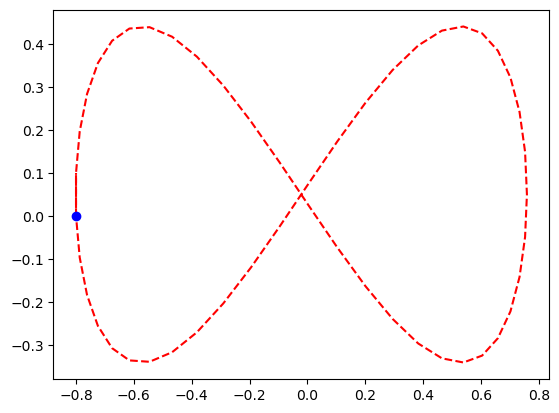

In [108]:
fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    plt.plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plt.plot(x_log[t,0], x_log[t,1], 'bo')
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())

In [109]:
def control(t, y): #control policy
    ### WRITE YOUR CONTROL POLICY HERE:
    ux=-np.sin(t)
    uy=np.cos(t)
    return np.array([ux, uy])

In [110]:
def simulate(Δt, x, u, wind_constant, wind_std): #dynamics
    wind_random = np.random.normal(0, wind_std, size=x.shape)
    x += Δt * u + wind_constant + wind_random
    
    return x

In [111]:
tf = 10
Δt = 0.1    # Time step
time = np.linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions

x = np.array([0., 0.])
x_log = [np.copy(x)]

for t in time:
    y = sense(x)
    u = control(t, y)  
    wind_constant = np.array([0.1, 0.1])  # Replace with your constant wind values
    wind_std = 0.1  # Standard deviation of random wind

    # Assuming you have initial values for Δt, x, and u
    x_updated = simulate(Δt, x, u, wind_constant, wind_std)
    #x = simulate(Δt, x, u)
    x_log.append(np.copy(x_updated))
    
x_log = np.array(x_log)


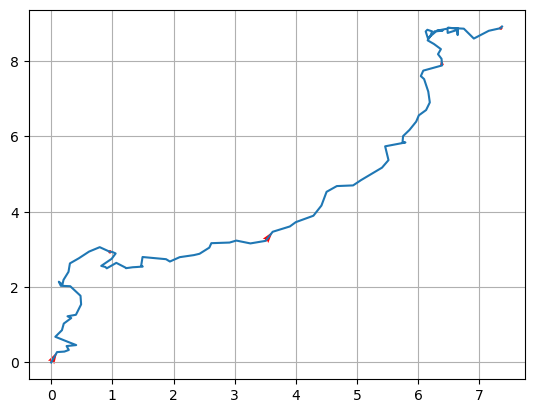

In [112]:
plt.grid()
plt.plot(x_log[:,0], x_log[:,1])
num_arrows = 5
arrow_indices = np.linspace(0, len(x_log) - 2, num_arrows, dtype=int)

# Adding arrows
for i in arrow_indices:
    dx = x_log[i + 1, 0] - x_log[i, 0]  # change in x
    dy = x_log[i + 1, 1] - x_log[i, 1]  # change in y
    plt.quiver(x_log[i, 0], x_log[i, 1], dx, dy, 
               angles='xy', scale_units='xy', scale=1, color='red')





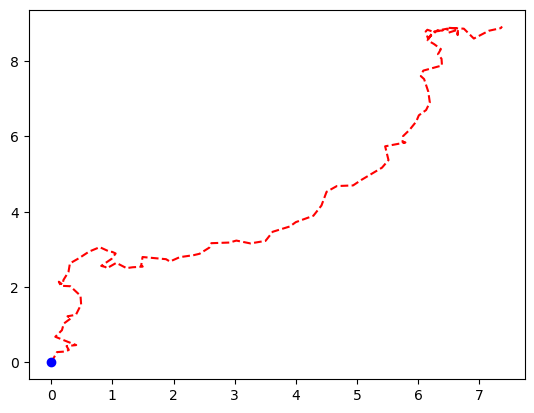

In [113]:
fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    plt.plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plt.plot(x_log[t,0], x_log[t,1], 'bo')
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())

In [115]:
def simulate(Δt, x, u): #dynamics
    x += Δt * u
    return x

In [116]:
tf = 10
Δt = 0.1    # Time step
time = np.linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
x = np.array([-0.8, 0.])
x_log = [np.copy(x)]


for t in time:
    y = sense(x)
    u = control(t, y)    
    x = simulate(Δt, x, u)
    x_log.append(np.copy(x))
    
x_log = np.array(x_log)


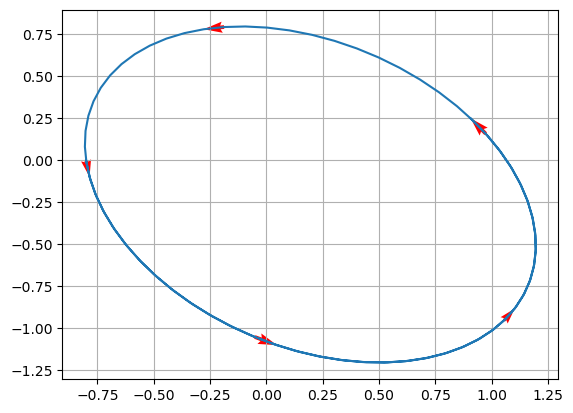

In [87]:
plt.grid()
plt.plot(x_log[:,0], x_log[:,1])
num_arrows = 5
arrow_indices = np.linspace(0, len(x_log) - 2, num_arrows, dtype=int)

# Adding arrows
for i in arrow_indices:
    dx = x_log[i + 1, 0] - x_log[i, 0]  # change in x
    dy = x_log[i + 1, 1] - x_log[i, 1]  # change in y
    plt.quiver(x_log[i, 0], x_log[i, 1], dx, dy, 
               angles='xy', scale_units='xy', scale=1, color='red')





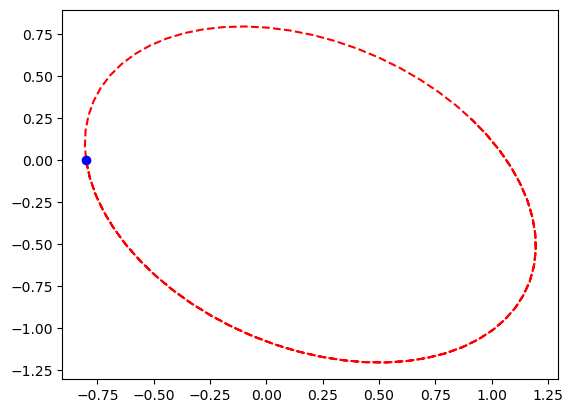

In [88]:
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML
    


fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    plt.plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plt.plot(x_log[t,0], x_log[t,1], 'bo')
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())